# Insurance Claim Fraud Detection

 # Problem:


In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made.
In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not.

### Importing necessary Libraries

In [162]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

## Importing dataset

In [163]:
# Reading the csv file
df = pd.read_csv("Automobile_insurance_fraud.csv")
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


it is a classification problem , fraud_detection is target column

### Exploratory Data Analysis

In [164]:
df.shape

(1000, 40)

In [165]:
# information about dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

Here the column_c39 has 0 non null values so we can drop this column.

In [166]:
# Dropping _c39 column
df.drop("_c39",axis=1,inplace=True)

In [167]:
# Checking null values
df.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

No null value found

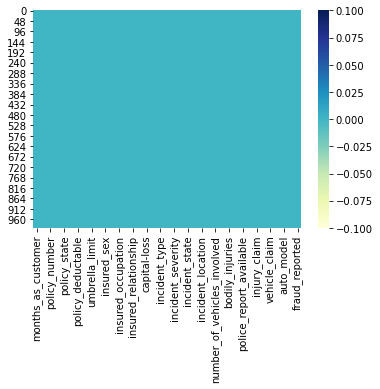

In [168]:
# Visualization for null vlue
sns.heatmap(df.isnull(),cmap="YlGnBu")
plt.show()

There are no null values present in the data.

In [169]:
# Checking the type of dataset
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

The dataset contains 3  types of data: integer datatype, float datatype and object datatype.

In [170]:
# Checking the number of unique values in each column
df.nunique().to_frame("No of Unique Values")

,No of Unique Values
months_as_customer,391
age,46
policy_number,1000
policy_bind_date,951
policy_state,3
policy_csl,3
policy_deductable,3
policy_annual_premium,991
umbrella_limit,11
insured_zip,995


These are unique values present in each column.

## Data Preprocessing

### Feature Selection

policy_number and incident_location have 1000 unique  it is not required for prediction and we can drop it.

In [171]:
# Dropping policy_number and incident_location columns
df.drop("policy_number",axis=1,inplace=True)
df.drop("incident_location",axis=1,inplace=True)

insured_zip has 995 unique values so we can drop it

In [172]:
# Dropping insured_zip column as it not that impactful
df.drop('insured_zip',axis=1,inplace=True)

In [173]:
# Checking the value counts of each columns
for i in df.columns:
    print(df[i].value_counts())
    print("\n")

194    8
285    7
140    7
230    7
128    7
      ..
347    1
113    1
337    1
117    1
0      1
Name: months_as_customer, Length: 391, dtype: int64


43    49
39    48
41    45
34    44
30    42
31    42
38    42
37    41
33    39
32    38
40    38
29    35
46    33
35    32
36    32
42    32
44    32
28    30
45    26
26    26
48    25
47    24
27    24
57    16
25    14
49    14
55    14
50    13
53    13
61    10
24    10
54    10
60     9
51     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
22     1
20     1
19     1
Name: age, dtype: int64


28-04-1992    3
05-08-1992    3
01-01-2006    3
16-05-2008    2
03-01-2004    2
             ..
30-12-2002    1
13-10-1991    1
26-08-2013    1
19-09-2009    1
16-04-1995    1
Name: policy_bind_date, Length: 951, dtype: int64


OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64


1000    351
500     342
2000    3

Columns umbrella_limit,capital-gains and capital-loss contains more zero values around 79.8%,50.8% and 47.5% respectively. Since Umbrella_limit column has more than 70% of zero values so we can drop it

In [174]:
# Dropping umbrella_limit column
df.drop("umbrella_limit",axis=1,inplace=True)

The policy_bind_date and incident_date have object data type which should be in datetime datatype. So we will convert this object datatype to datetime.

In [175]:
# Converting Date columns from object type into datetime data type
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])
df['incident_date']=pd.to_datetime(df['incident_date'])

In [176]:
# Again checking the type of dataset
df.dtypes

months_as_customer                      int64
age                                     int64
policy_bind_date               datetime64[ns]
policy_state                           object
policy_csl                             object
policy_deductable                       int64
policy_annual_premium                 float64
insured_sex                            object
insured_education_level                object
insured_occupation                     object
insured_hobbies                        object
insured_relationship                   object
capital-gains                           int64
capital-loss                            int64
incident_date                  datetime64[ns]
incident_type                          object
collision_type                         object
incident_severity                      object
authorities_contacted                  object
incident_state                         object
incident_city                          object
incident_hour_of_the_day          

In [177]:
# Extracting Day, Month and Year column from policy_bind_date
df['policy_bind_day'] = df['policy_bind_date'].dt.day
df['policy_bind_month'] = df['policy_bind_date'].dt.month
df['policy_bind_year'] = df['policy_bind_date'].dt.year

# Extracting Day, Month and Year column from incident_date
df['incident_day'] = df['incident_date'].dt.day
df['incident_month'] = df['incident_date'].dt.month
df['incident_year'] = df['incident_date'].dt.year

Now we have extracted day, month and year columns from both policy_bind_date and incident_date.So we can drop these columns.

In [178]:
# Dropping policy_bind_date and incident_date columns
df.drop(['policy_bind_date','incident_date'],axis=1,inplace=True)

From the value_counts of the columns we can also observe that some columns have "?" values

In [179]:
# Checking which column contains "?"
df[df.columns[(df=="?").any()]].nunique()

collision_type             4
property_damage            3
police_report_available    3
dtype: int64

These are the columns which contains "?" sign. Since these columns seems to be categorical so we will replcae "?" values with most frequent occuring values of the respective columns that is their mode values.

In [180]:
# Checking the mode of the above columns
print("The mode of collision_type is:",df['collision_type'].mode())
print("The mode of property_damage is:",df['property_damage'].mode())
print("The mode of police_report_available is:",df['police_report_available'].mode())

The mode of collision_type is: 0    Rear Collision
dtype: object
The mode of property_damage is: 0    ?
dtype: object
The mode of police_report_available is: 0     ?
1    NO
dtype: object


The mode of property_damage and police_report_available is "?", which means the data is almost covered by "?" sign. So will fill them ny the second highest count of the respective column.

In [181]:
# Checking value_count of property_damage column and police_report_available
print("The value count of property_damage:\n",df["property_damage"].value_counts())
print("\n")
print("The value count of property_damage:\n",df["property_damage"].value_counts())

The value count of property_damage:
 ?      360
NO     338
YES    302
Name: property_damage, dtype: int64


The value count of property_damage:
 ?      360
NO     338
YES    302
Name: property_damage, dtype: int64


Here "NO" is the second highest occured category in both property_damage and police_report_available column. We will replace "?" ny "NO".

In [182]:
# Replacing "?" by their mode values
df['collision_type'] = df.collision_type.str.replace('?', df['collision_type'].mode()[0])
df['property_damage'] = df.property_damage.str.replace('?', "NO")
df['police_report_available'] = df.police_report_available.str.replace('?', "NO")

In [183]:
# Checking value count again
print("The value count of collision_type:\n", df["collision_type"].value_counts())
print("\n")
print("The value count of property_damage:\n", df["property_damage"].value_counts())
print("\n")
print("The value count of police_report_available:\n", df["police_report_available"].value_counts())

The value count of collision_type:
 Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64


The value count of property_damage:
 NO     698
YES    302
Name: property_damage, dtype: int64


The value count of police_report_available:
 NO     686
YES    314
Name: police_report_available, dtype: int64


Here we have replaced the "?" sign by mode and "NO" values.

The policy_csl column showing object data type but it contains numerical data, may be it is because of the presence of "/" in that column. So first we will extract two columns csl_per_person and csl_per_accident from policy_csl colums and then will convert their object data type into integer data type.

In [184]:
# Extracting csl_per_person and csl_per_accident from policy_csl column
df['csl_per_person'] = df.policy_csl.str.split('/',expand=True)[0]
df['csl_per_accident'] = df.policy_csl.str.split('/',expand=True)[1]

In [185]:
# Converting object datatype into integer data type
df['csl_per_person']=df['csl_per_person'].astype('int64')
df['csl_per_accident']=df['csl_per_accident'].astype('int64')

In [186]:
# Since we have extracted the data type from policy_csl, lets drop that column
df.drop("policy_csl",axis=1,inplace=True)

In [187]:
# Lets extract age of the vehicle from auto_year by subtracting it from the year 2018
df['Vehicle_Age']=2018-df['auto_year']
df.drop("auto_year",axis=1,inplace=True)

Here we have extracted age of the vehicle on the basis of auto yeat by assuming the data is collected in the year 2018.

In [188]:
# Lets check the unique values again
df.nunique().to_frame("No of unique values")

,No of unique values
months_as_customer,391
age,46
policy_state,3
policy_deductable,3
policy_annual_premium,991
insured_sex,2
insured_education_level,7
insured_occupation,14
insured_hobbies,20
insured_relationship,6


These are the unique values present in each column after feature extraction and selection. Here incident_year column has one unique value through out the column also it is not impacting the predictions so we can drop this column.

In [189]:
# Dropping incident_Year column
df.drop("incident_year",axis=1,inplace=True)

In [190]:
# Lets take a look at the dataframe after preprocessing
df.head()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
0,328,48,OH,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,Y,17,10,2014,25,1,250,500,14
1,228,42,IN,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,Y,27,6,2006,21,1,250,500,11
2,134,29,OH,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,N,9,6,2000,22,2,100,300,11
3,256,41,IL,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,Y,25,5,1990,1,10,250,500,4
4,228,44,IL,1000,1583.91,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,N,6,6,2014,17,2,500,1000,9


In [191]:
# Checking the dimension of dataset
df.shape

(1000, 39)

Separating numerical and categorical columns

In [192]:
# Checking for categorical columns
categorical_col = []
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_col.append(i)
print("Categorical columns are:\n",categorical_col)
print("\n")

# Checking for numerical columns
numerical_col = []
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_col.append(i)
print("Numerical columns are:\n",numerical_col)
print("\n")

Categorical columns are:
 ['policy_state', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


Numerical columns are:
 ['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'policy_bind_day', 'policy_bind_month', 'policy_bind_year', 'incident_day', 'incident_month', 'csl_per_person', 'csl_per_accident', 'Vehicle_Age']




In [193]:
# Checking the unique values of target 
df['fraud_reported'].unique()

array(['Y', 'N'], dtype=object)

These are the two unique categories in fraud_reported column. These values represents if an insurance is fraudulent or not.

In [194]:
# Cehcking the list of counts of target
df['fraud_reported'].value_counts()

N    753
Y    247
Name: fraud_reported, dtype: int64

From the value counts we can notice that the data is not balanced. So we can use ovesampling method to balance the data before building the models.

## Description of Dataset

In [195]:
# statistical summary of numerical columns
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,15.448000,6.559000,2001.604000,13.08400,3.407000,272.650000,580.200000,12.897000
std,115.113174,9.140287,611.864673,244.167395,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,8.850176,3.391758,7.360391,10.44318,3.276291,161.603196,287.420547,6.015861
min,0.000000,19.000000,500.000000,433.330000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1.000000,1.000000,1990.000000,1.00000,1.000000,100.000000,300.000000,3.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,8.000000,4.000000,1995.000000,2.00000,1.000000,100.000000,300.000000,8.000000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,16.000000,7.000000,2002.000000,15.00000,2.000000,250.000000,500.000000,13.000000
75%,276.250000,44.000000,2000.000000,1415.695000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,23.000000,9.000000,2008.000000,22.00000,5.000000,500.000000,1000.000000,18.000000
max,479.000000,64.000000,2000.000000,2047.590000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,31.000000,12.000000,2015.000000,31.00000,12.000000,500.000000,1000.000000,23.000000


There is a huge difference in 75% and max it shows that huge outliers present in the columns.

In some of the columns like policy_deductable, capital-gains, injury_claim etc we can observe the mean value is greater than the median(50%) which means the data in those columns are skewed to right.

And in some of the columns like total_claim_amount, vehicle_claim...etc we can observe the median is greater than the mean which means the data in the columns are skewed to left.



# Data Visualization

## Univariate Analysis

### Plotting categorical columns

N    753
Y    247
Name: fraud_reported, dtype: int64


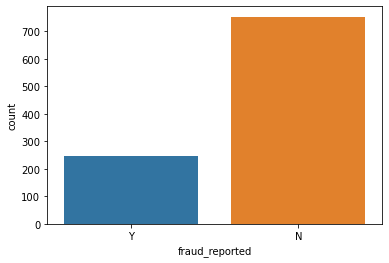

In [196]:
# Visualizing how many insurance claims is fraudulent
print(df['fraud_reported'].value_counts())
sns.countplot(df['fraud_reported'],palette='tab10')
plt.show()

N    753
Y    247
Name: fraud_reported, dtype: int64


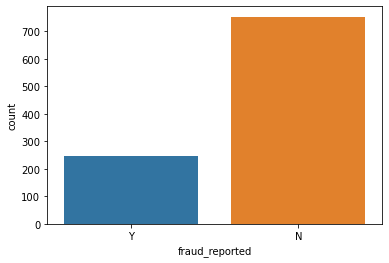

In [197]:
# Visualizing how many insurance claims is fraudulent
print(df['fraud_reported'].value_counts())
sns.countplot(df['fraud_reported'],palette='tab10')
plt.show()

N    753
Y    247
Name: fraud_reported, dtype: int64


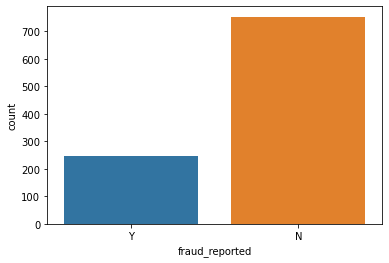

In [198]:
# Visualizing how many insurance claims is fraudulent
print(df['fraud_reported'].value_counts())
sns.countplot(df['fraud_reported'],palette='tab10')
plt.show()

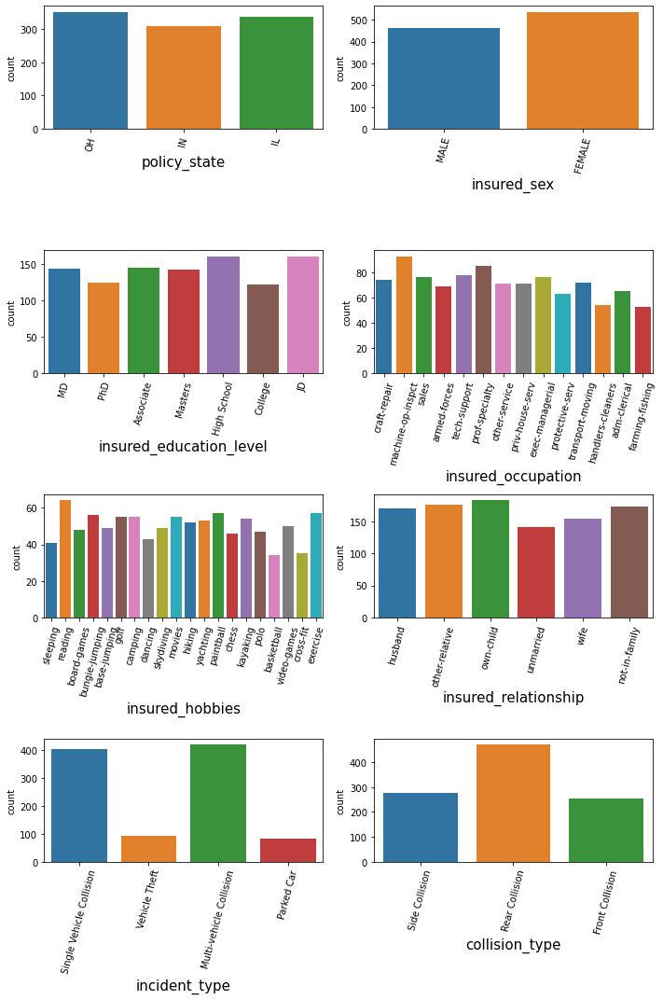

In [199]:
plt.figure(figsize=(10,15))
plotnumber=1
for col in categorical_col:
    if plotnumber<=8:
        ax = plt.subplot(4,2,plotnumber)
        sns.countplot(df[col],palette="tab10")
        plt.xticks(rotation=75)
        plt.xlabel(col,fontsize=15)
    plotnumber+=1
plt.tight_layout()
plt.show()

# Checking skewness

### Plotting numerical columns.

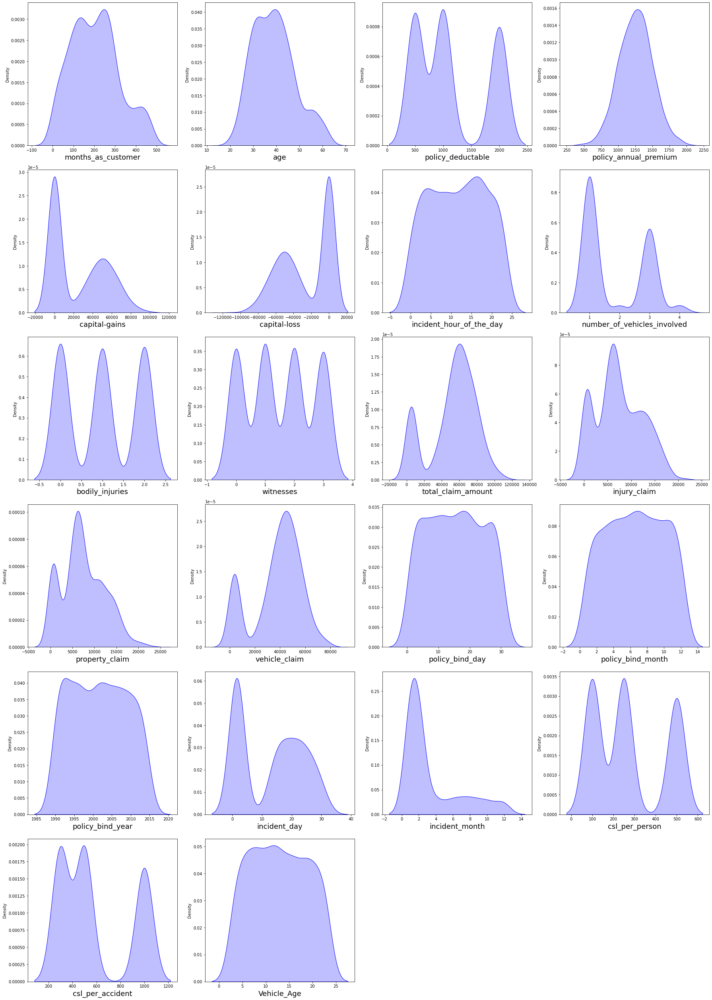

In [200]:
# Checking how the data has been distriubted in each column

plt.figure(figsize=(25,35),facecolor='white')
plotnumber=1
for column in numerical_col:
    if plotnumber<=23:
        ax=plt.subplot(6,4,plotnumber)
        sns.distplot(df[column],color="blue",hist=False,kde_kws={"shade": True})
        plt.xlabel(column,fontsize=18)
    plotnumber+=1
plt.tight_layout()


The data is normally distributed in most of the columns.

Some of the columns like capital-gains and incident_months  skewed to the right.

The data in the column capital loss is skewed to left.

## Bivariate Analysis

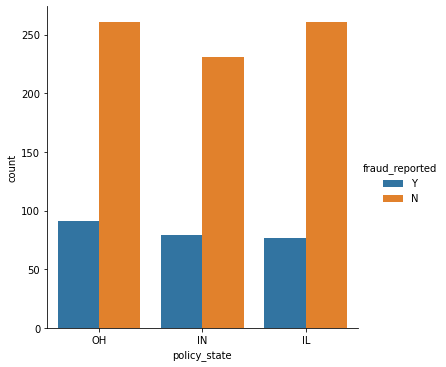

In [201]:
# Comparing policy_state and fraud_reported
sns.factorplot('policy_state',kind='count',data=df,hue='fraud_reported',palette='tab10')
plt.show()

Fraud report is high in "OH" policy_state.

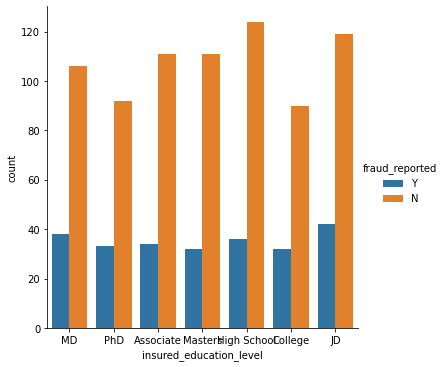

In [202]:
# Comparing insured_education_level and fraud_reported
sns.factorplot('insured_education_level',kind='count',data=df,hue='fraud_reported',palette='tab10')
plt.show()

The fraud reported very less for the people who have high scool education and in  "JD" education have high fruad report.
The people who have high insured education are facing insurance fruadulent compared to the people with less insured education level.

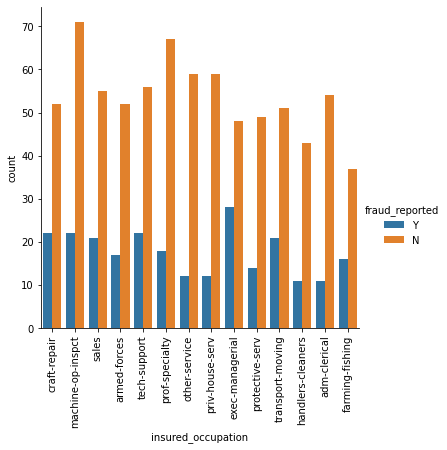

In [203]:
# Comparing insured_occupation and fraud_reported
sns.factorplot('insured_occupation',kind='count',data=df,hue='fraud_reported',palette="tab10")
plt.xticks(rotation=90)
plt.show()

The people who are in the position exec-managerials have high fraud reports compared to others.

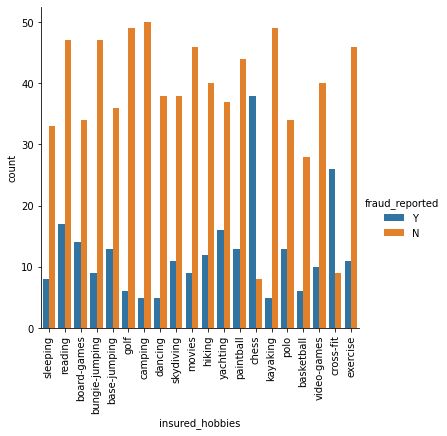

In [204]:
# Comparing insured_hobbies and fraud_reported
sns.factorplot('insured_hobbies',kind='count',data=df,hue='fraud_reported',palette='tab10')
plt.xticks(rotation=90)
plt.show()

The fraud report is high for the people who have the hobby of playing chess and cross fit.

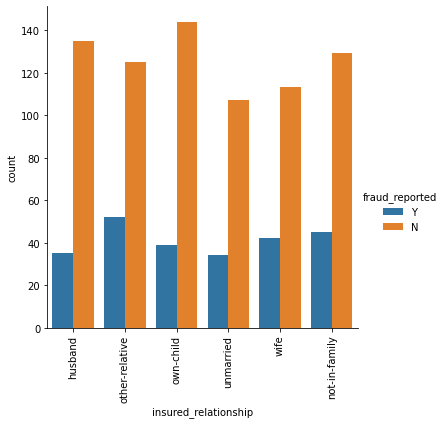

In [205]:
# Comparing insured_hobbies and fraud_reported
sns.factorplot('insured_relationship',kind='count',data=df,hue='fraud_reported',palette='tab10')
plt.xticks(rotation=90)
plt.show()

The fraud report is high for the customers who have other relative and it is less for unmarried people.

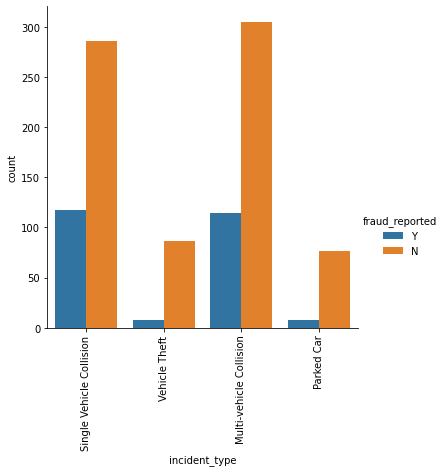

In [206]:
# Comparing incident_type and fraud_reported
sns.factorplot('incident_type',kind='count',data=df,hue='fraud_reported',palette="tab10")
plt.xticks(rotation=90)
plt.show()

In Multivehicle collision and single vehicle collision, the fraud report is very high compared to others.

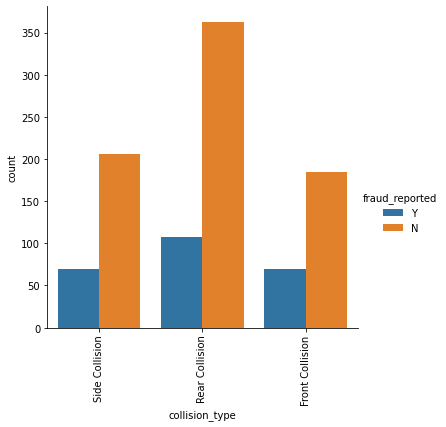

In [207]:
#Comparing collision_type and fraud_reported
sns.factorplot('collision_type',kind='count',data=df,hue='fraud_reported',palette="tab10")
plt.xticks(rotation=90)
plt.show()

The fraud level is high in the collision type Rear Collision and other two collision type have average reports.

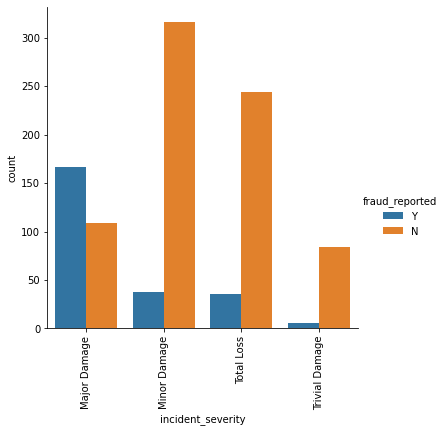

In [208]:
# Comparing incident_severity and fraud_reported
sns.factorplot('incident_severity',kind='count',data=df,hue='fraud_reported',palette="tab10")
plt.xticks(rotation=90)
plt.show()

The fraud report is high in Major damage incident severity and for Trivial Damage the report is less compared to others.

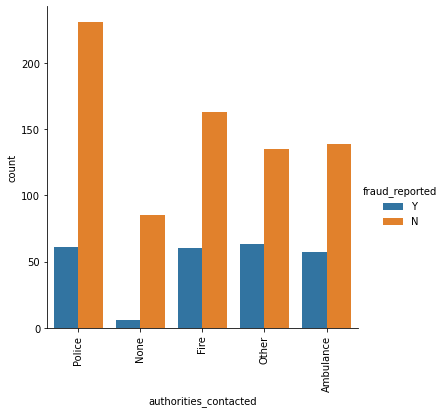

In [209]:
# Comparing authorities_contacted and fraud_reported
sns.factorplot('authorities_contacted',kind='count',data=df,hue='fraud_reported',palette="tab10")
plt.xticks(rotation=90)
plt.show()

The police contacted cases are very high and the fraud report is in equal for all the authorities except None.

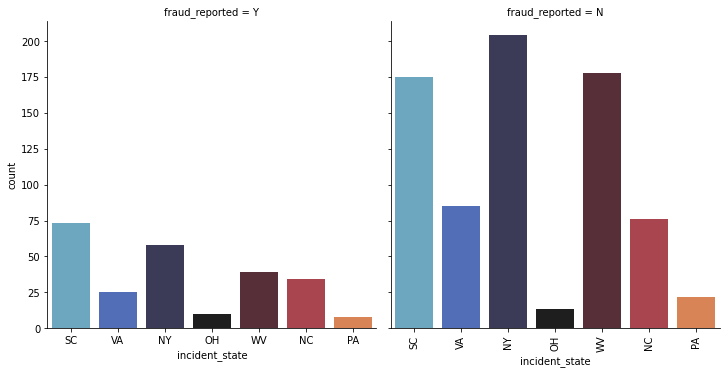

In [210]:
# Comparing incident_state and fraud_reported
sns.factorplot('incident_state',kind='count',data=df,col='fraud_reported',palette="icefire")
plt.xticks(rotation=90)
plt.show()

The state SC has high fraud reports compared to other states.

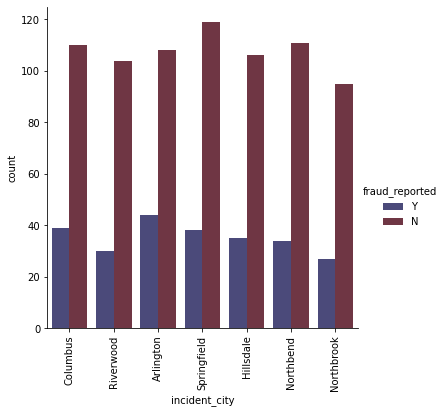

In [211]:
# Comparig incident_city and fraud_reported
sns.catplot('incident_city',kind='count',data=df,hue='fraud_reported',palette="icefire")
plt.xticks(rotation=90)
plt.show()

The cities Riverwood and Northbrook have very less fraud reports compared to others.

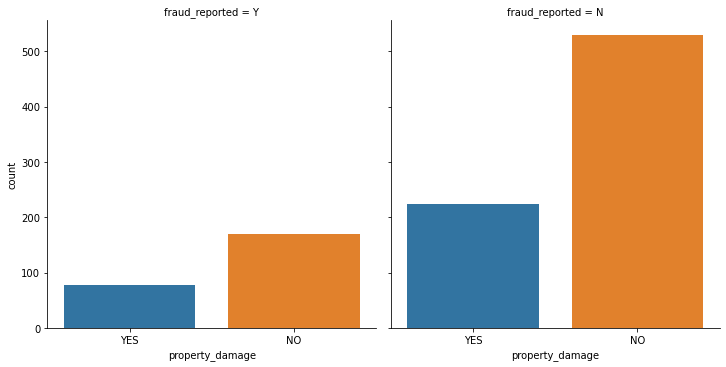

In [212]:
# Comparing property_damage and fraud_reported
sns.factorplot('property_damage',kind='count',data=df,col='fraud_reported',palette="tab10")
plt.show()

The customers who do not have any property damage case they have high fraud reports.

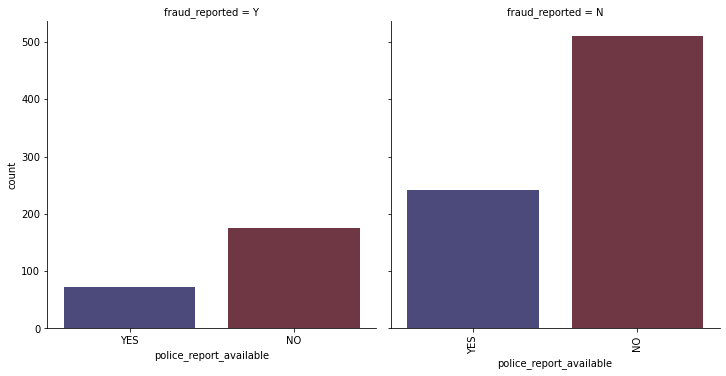

In [213]:
# Comparing police_report_available and fraud_reported
sns.factorplot('police_report_available',kind='count',data=df,col='fraud_reported',palette="icefire")
plt.xticks(rotation=90)
plt.show()

If there is no police report available then the fraud report is very high.

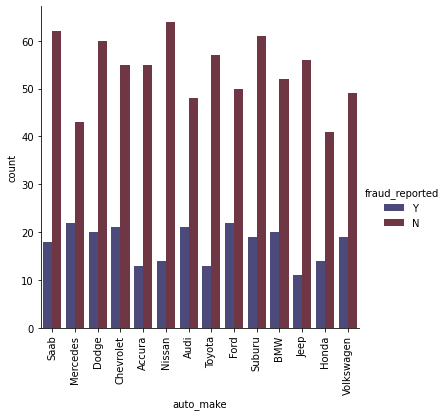

In [214]:
# Comparing auto_make and fraud_reported
sns.catplot('auto_make',kind='count',data=df,hue='fraud_reported',palette="icefire")
plt.xticks(rotation=90)
plt.show()

In all the auto make cases the fraud report is almost same

<AxesSubplot:title={'center':'Comparison between months_as_customer and total_claim_amount'}, xlabel='months_as_customer', ylabel='total_claim_amount'>

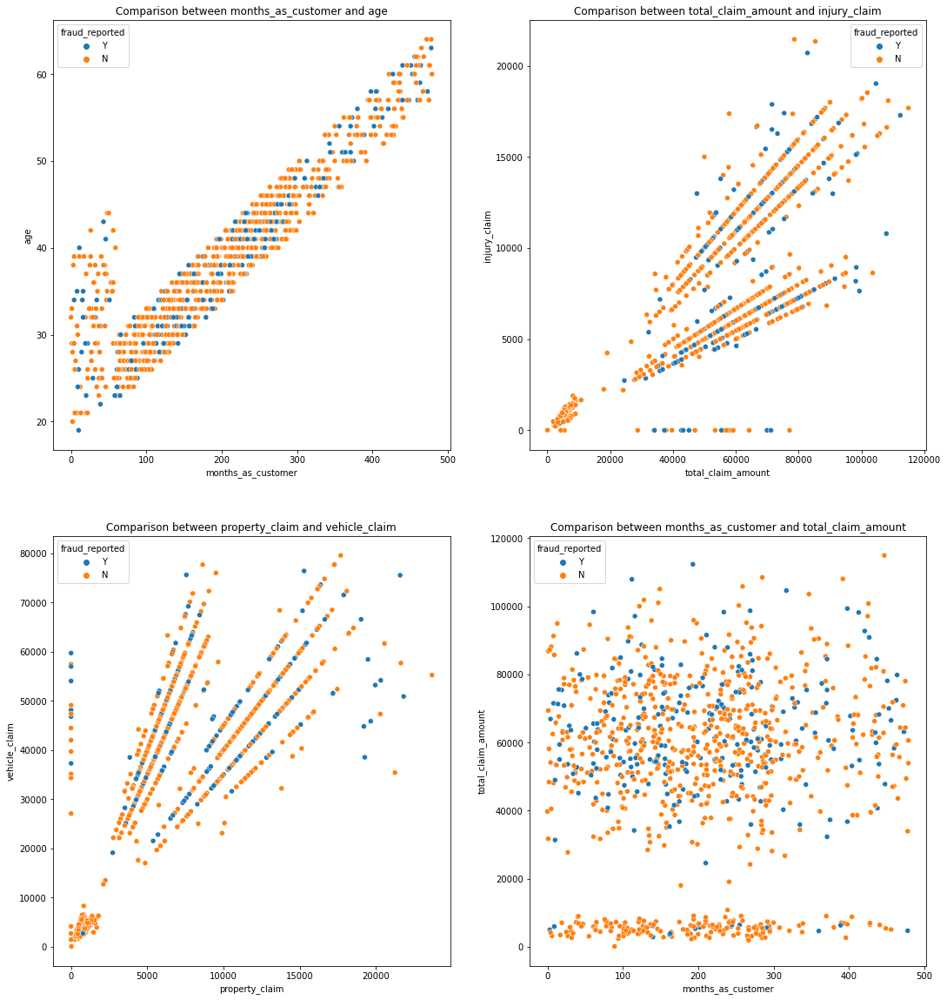

In [215]:
# Comparison between two variables
plt.figure(figsize=(18,20))
plt.subplot(2,2,1)
plt.title("Comparison between months_as_customer and age")
sns.scatterplot(df['months_as_customer'],df['age'],hue=df['fraud_reported'])

plt.subplot(2,2,2)
plt.title("Comparison between total_claim_amount and injury_claim")
sns.scatterplot(df['total_claim_amount'],df['injury_claim'],hue=df['fraud_reported'])

plt.subplot(2,2,3)
plt.title("Comparison between property_claim and vehicle_claim")
sns.scatterplot(df['property_claim'],df['vehicle_claim'],hue=df['fraud_reported'])

plt.subplot(2,2,4)
plt.title("Comparison between months_as_customer and total_claim_amount")
sns.scatterplot(df['months_as_customer'],df['total_claim_amount'],hue=df['fraud_reported'])

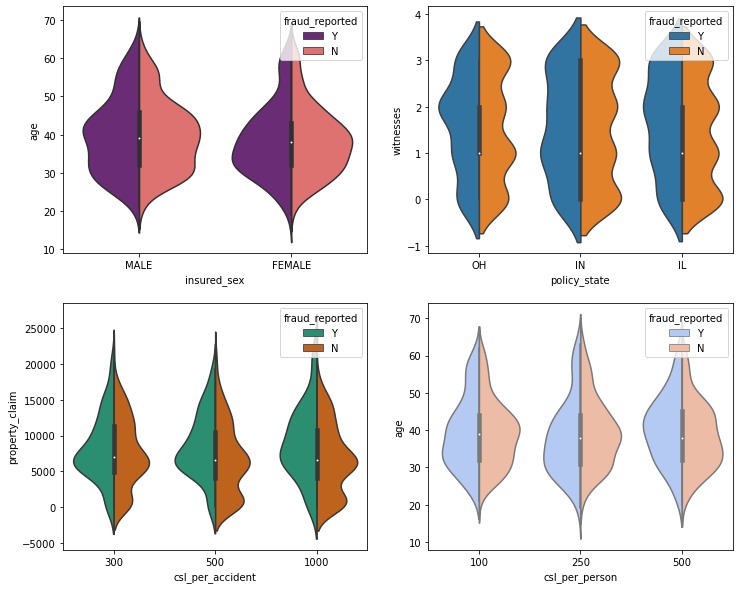

In [216]:
fig,axes=plt.subplots(2,2,figsize=(12,10))

# Comparing insured_sex and age
sns.violinplot(x='insured_sex',y='age',ax=axes[0,0],data=df,palette="magma",hue="fraud_reported",split=True)

# Comparing policy_state and witnesses
sns.violinplot(x='policy_state',y='witnesses',ax=axes[0,1],data=df,hue="fraud_reported",split=True,palette="tab10")

# Comparing csl_per_accident and property_claim
sns.violinplot(x='csl_per_accident',y='property_claim',ax=axes[1,0],data=df,hue="fraud_reported",split=True,palette="Dark2")

# Comparing csl_per_person and age
sns.violinplot(x='csl_per_person',y='age',ax=axes[1,1],data=df,hue="fraud_reported",split=True,palette="coolwarm")
plt.show()

* The fraud report is high for both the males-females having age between 30-45.
* The people who own the policy state "IN" have high fraud report.
* The person who has csl per accidemt insurance by claimimg property in the range 5000-15000 have the fraud report.
* The csl_per_person with age 30-45 are facing the fraudulent reports.

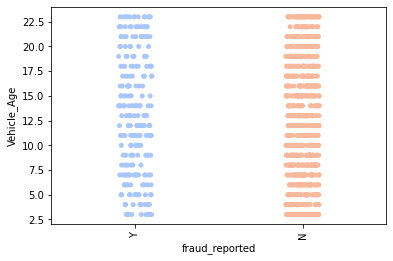

In [217]:
# Comparing  Vehicle_Age and fraud_reported
sns.stripplot(y='Vehicle_Age',x='fraud_reported',data=df,palette="coolwarm")
plt.xticks(rotation=90)
plt.show()

There is no significant difference between the features.

## Multivariate Analysis

In [218]:
df['csl_per_accident']

0       500
1       500
2       300
3       500
4      1000
       ... 
995    1000
996     300
997     500
998    1000
999     500
Name: csl_per_accident, Length: 1000, dtype: int64

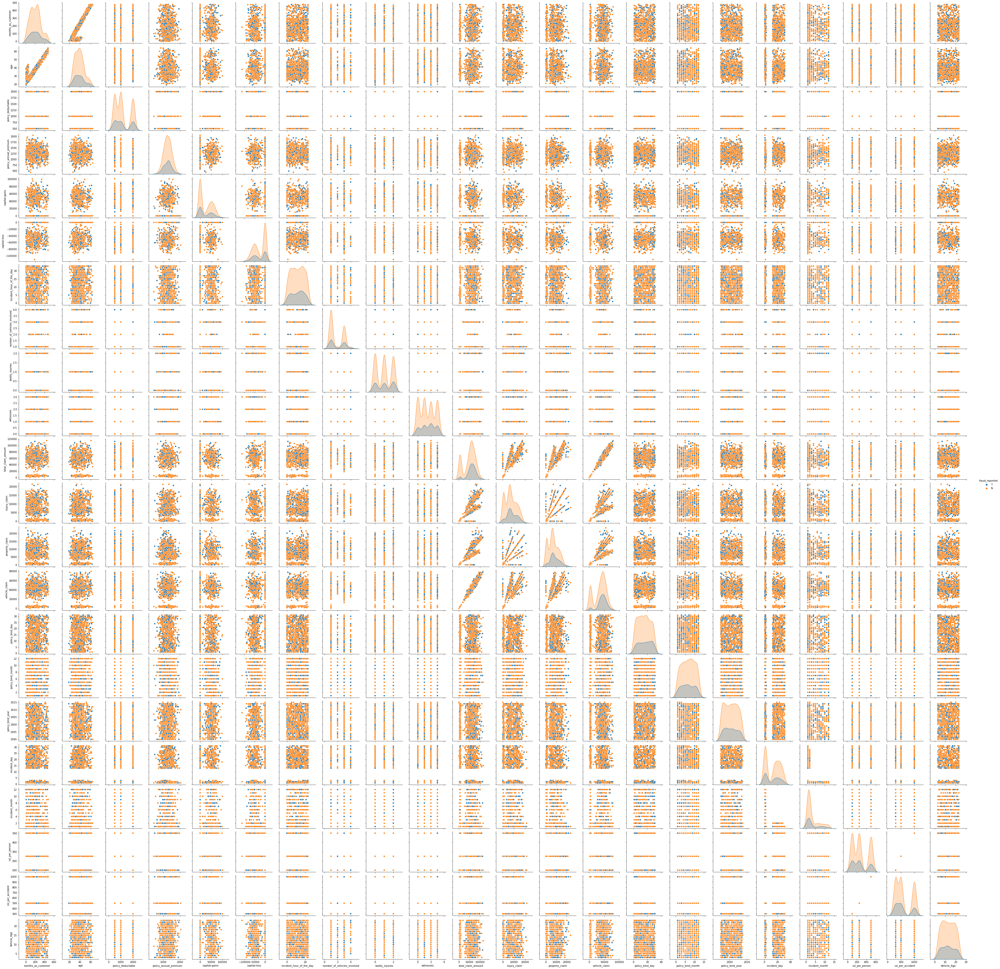

In [219]:
sns.pairplot(df,hue="fraud_reported",palette="tab10")
plt.show()

From this plot we can observe strong corelation and outliers present

# Identifying the Outliers

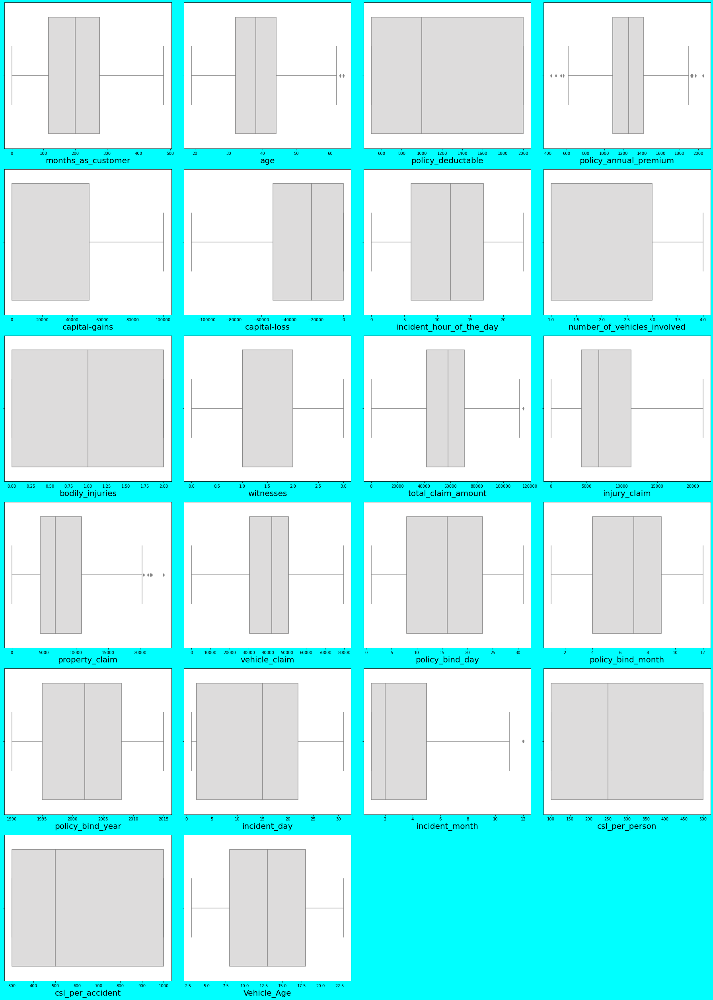

In [220]:
# Lets check the outliers by plotting boxplot
plt.figure(figsize=(25,35),facecolor="cyan")
plotnumber=1
for col in numerical_col:
    if plotnumber<=23:
        ax = plt.subplot(6,4,plotnumber)
        sns.boxplot(df[col],palette="coolwarm")
        plt.xlabel(col,fontsize=20)
    plotnumber+=1
plt.tight_layout()


age,policy_annual_premium,total_claim_amount,property_claim,incident_month ptesents outliers

These are the numerical columns which contains outliers. Lets remove outliers in these columns using either Zscore method or IQR.

## Removing Outliers

### Zscore method

In [221]:
# Features containing outliers
features = df[["age","policy_annual_premium","total_claim_amount","property_claim","incident_month"]]
from scipy.stats import zscore
z = np.abs(zscore(features))
z

array([[0.99083647, 0.61670461, 0.71425742, 1.16550497, 0.73503976],
       [0.33407345, 0.24252118, 1.80731185, 1.37269599, 0.73503976],
       [1.08891308, 0.64223266, 0.68636176, 0.73607206, 0.42966387],
       ...,
       [0.54161057, 0.52073881, 0.55850675, 0.0208261 , 0.73503976],
       [2.52328351, 0.41186558, 0.21910974, 0.45197603, 0.42966387],
       [2.3043625 , 2.00870981, 1.80769081, 1.34366428, 0.42966387]])

Now we have removed the outliers.

In [222]:
# Creating new dataframe
new_df = df[(z<3).all(axis=1)]
new_df

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
0,328,48,OH,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,Y,17,10,2014,25,1,250,500,14
1,228,42,IN,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,Y,27,6,2006,21,1,250,500,11
2,134,29,OH,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,N,9,6,2000,22,2,100,300,11
3,256,41,IL,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,Y,25,5,1990,1,10,250,500,4
4,228,44,IL,1000,1583.91,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,N,6,6,2014,17,2,500,1000,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,1000,1310.80,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,20,1,YES,0,1,NO,87200,17440,8720,61040,Honda,Accord,N,16,7,1991,22,2,500,1000,12
996,285,41,IL,1000,1436.79,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,23,1,YES,2,3,NO,108480,18080,18080,72320,Volkswagen,Passat,N,1,5,2014,24,1,100,300,3
997,130,34,OH,500,1383.49,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,4,3,NO,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,N,17,2,2003,23,1,250,500,22
998,458,62,IL,2000,1356.92,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,2,1,NO,0,1,YES,46980,5220,5220,36540,Audi,A5,N,18,11,2011,26,2,500,1000,20


This is the new dataframe after removing the outliers.

In [223]:
print(df.shape)
print(new_df.shape)

(1000, 39)
(996, 39)


In [224]:
# Checking data loss
loss = (1000-996)/1000*100
loss

0.4

Here we are losing very less data.Lets check using IQR.

## IQR(InterQuantile Range)

In [225]:
#1st quantile
Q1 = features.quantile(0.25)

#3rd quantile
Q3 = features.quantile(0.75)

#IQR
IQR=Q3-Q1

df1=df[~((df<(Q1-1.5*IQR))|(df>(Q3+1.5*IQR))).any(axis=1)]

In [226]:
df1.shape

(942, 39)

In [227]:
loss = (1000-942)/1000*100
loss

5.800000000000001

Using IQR method also the data loss is very less.But compared to Zscore the loss is high in IQR, So lets consider zscore.

# Checking skewness

In [228]:
new_df.skew()

months_as_customer             0.359605
age                            0.474526
policy_deductable              0.473229
policy_annual_premium          0.032042
capital-gains                  0.478850
capital-loss                  -0.393015
incident_hour_of_the_day      -0.039123
number_of_vehicles_involved    0.500364
bodily_injuries                0.011117
witnesses                      0.025758
total_claim_amount            -0.593473
injury_claim                   0.267970
property_claim                 0.357130
vehicle_claim                 -0.619755
policy_bind_day                0.028923
policy_bind_month             -0.029722
policy_bind_year               0.058499
incident_day                   0.055659
incident_month                 1.377097
csl_per_person                 0.413713
csl_per_accident               0.609316
Vehicle_Age                    0.049276
dtype: float64

The following features contains skewness:
* total_claim_amount
* vehicle_claim
* incident_Month
* csl_per_acciden

## Removing Skewness using yeo-johnson method

In [229]:
# Removing skewness using yeo-johnson  method to get better prediction
skew = ["total_claim_amount","vehicle_claim","incident_month","csl_per_accident"]

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [230]:
new_df[skew] = scaler.fit_transform(new_df[skew].values)
new_df[skew].head()

,total_claim_amount,vehicle_claim,incident_month,csl_per_accident
0,0.717556,0.754553,-1.101370,0.052612
1,-1.777785,-1.787353,-1.101370,0.052612
2,-0.716483,-0.820820,-0.026479,-1.174021
3,0.392931,0.678427,1.553647,0.052612
4,-1.730555,-1.740710,-0.026479,1.313327


In [231]:
# Checking skewness after using yeo-johnson ethod
new_df[skew].skew()

total_claim_amount   -0.508953
vehicle_claim        -0.521354
incident_month        0.305741
csl_per_accident      0.110964
dtype: float64

The skewness is almost reduced in all the columns.

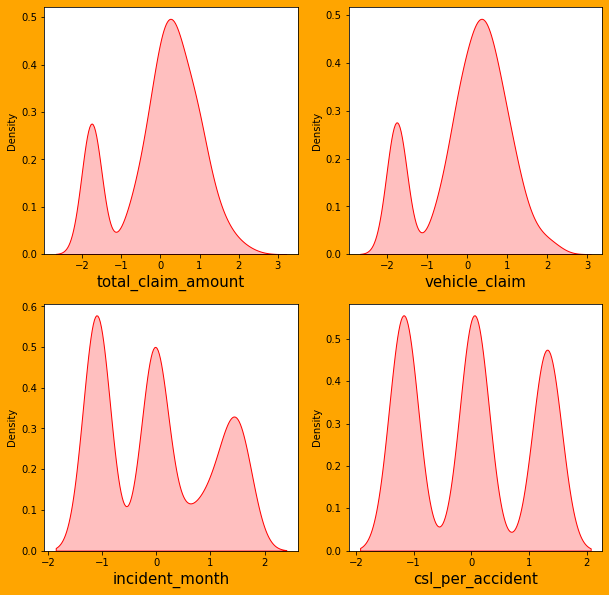

In [232]:
# After removing skewness let's check how the data has been distributed in each column.

plt.figure(figsize=(10,10), facecolor='orange')
plotnumber = 1

for column in new_df[skew]:
    if plotnumber<=4:
        ax = plt.subplot(2,2,plotnumber)
        sns.distplot(new_df[column],color='red',kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()

The data looks almost normal after removing the skewness compared to the previous data

## Encoding the catgorical data

In [233]:
from sklearn.preprocessing import LabelEncoder

lbl=LabelEncoder()
new_df[categorical_col]= new_df[categorical_col].apply(lbl.fit_transform)

In [234]:
new_df[categorical_col].head()

,policy_state,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
0,2,1,4,2,17,0,2,2,0,4,4,1,1,1,10,1,1
1,1,1,4,6,15,2,3,1,1,4,5,5,0,0,8,12,1
2,2,0,6,11,2,3,0,1,1,4,1,1,0,0,4,30,0
3,0,0,6,1,2,4,2,0,0,4,2,0,0,0,3,34,1
4,0,1,0,11,2,4,3,1,1,2,1,0,0,0,0,31,0


## Correlation

In [235]:
# Checking the correlation between features and label
cor = new_df.corr()
cor

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
months_as_customer,1.000000,0.922092,0.000118,0.023512,-0.003378,0.059002,-0.000848,0.005365,-0.092575,0.071097,0.007601,0.020771,-0.017202,-0.072479,-0.061932,0.011406,0.006906,-0.001837,0.068962,0.013609,0.002663,-0.011126,0.063530,-0.018760,0.064662,0.066416,0.041157,0.062392,0.049222,0.002908,0.020966,0.054175,0.004955,-0.046010,-0.013502,0.019029,-0.022063,-0.022928,-0.001287
age,0.922092,1.000000,-0.015182,0.026772,0.005890,0.072900,0.001485,0.014030,-0.080587,0.075940,-0.006333,0.008192,-0.025979,-0.075892,-0.060361,0.016000,0.007053,-0.004009,0.085509,0.021140,-0.005795,-0.017461,0.056658,-0.018493,0.070582,0.075480,0.064230,0.062165,0.032105,0.016258,0.012408,0.054465,0.015874,-0.035505,-0.008174,0.016685,-0.012844,-0.012459,-0.003268
policy_state,0.000118,-0.015182,1.000000,0.010740,0.014475,-0.019294,-0.032551,-0.031016,-0.040215,-0.018855,0.072552,-0.032268,0.031769,0.050953,-0.026728,-0.017738,0.009195,-0.004475,0.026464,-0.043447,-0.009334,0.008992,0.024809,0.065957,-0.008788,-0.046398,0.002678,-0.000472,0.015848,-0.024513,0.028864,0.001030,0.071527,-0.005709,0.013370,0.026233,-0.005866,-0.000653,-0.002323
policy_deductable,0.023512,0.026772,0.010740,1.000000,-0.008445,-0.011671,0.014571,-0.050024,0.005134,-0.021763,0.035950,-0.024018,-0.038696,-0.054153,-0.017352,-0.000210,0.007419,-0.046560,0.059733,0.051317,0.014131,-0.023384,0.069433,0.040969,0.025169,0.040337,0.069537,0.005902,-0.034266,-0.003597,0.015833,0.011204,-0.051368,-0.048465,-0.018867,-0.000169,0.006634,0.006179,-0.027497
policy_annual_premium,-0.003378,0.005890,0.014475,-0.008445,1.000000,0.041830,-0.021475,0.030963,-0.014376,0.006474,-0.009757,0.029835,0.049336,0.034999,-0.015788,-0.058852,0.049047,0.047389,-0.003001,-0.044711,0.078922,0.025323,0.006365,0.029619,0.002905,-0.024031,-0.007964,0.012961,0.011595,-0.034998,-0.010174,-0.030886,-0.028452,0.001650,0.016400,-0.012386,0.028569,0.030755,0.040439
insured_sex,0.059002,0.072900,-0.019294,-0.011671,0.041830,1.000000,0.007473,-0.009257,-0.019600,0.004104,-0.020651,-0.024440,0.010572,-0.014399,-0.029576,0.019000,-0.021822,0.013251,0.017950,0.019275,0.025911,-0.020201,0.044173,0.009884,-0.020117,0.004603,-0.009457,-0.026816,0.026040,-0.017679,0.032173,0.045694,-0.007259,-0.031981,-0.007249,0.024223,-0.019001,-0.008959,0.028638
insured_education_level,-0.000848,0.001485,-0.032551,0.014571,-0.021475,0.007473,1.000000,-0.021502,0.022806,-0.021595,0.040283,0.039890,0.012385,-0.020687,-0.007395,-0.011831,-0.006118,-0.019160,-0.057232,-0.001308,-0.048624,-0.011455,0.017577,0.054380,0.076528,0.083672,0.058663,0.070001,0.057528,0.050878,0.011520,0.014464,-0.007489,0.017801,-0.055411,0.069312,0.011093,0.010425,-0.045094
insured_occupation,0.005365,0.014030,-0.031016,-0.050024,0.030963,-0.009257,-0.021502,1.000000,-0.009818,-0.008141,-0.007553,-0.021993,0.003427,0.006634,0.002255,-0.007367,-0.021531,-0.002158,-0.021308,-0.015177,-0.018839,-0.001830,-0.011373,-0.021730,0.006458,0.022693,0.008301,0.000954,0.044321,0.020878,0.003335,-0.003030,0.024516,-0.025282,-0.022786,0.013226,0.018978,0.019575,0.004827
insured_hobbies,-0.092575,-0.080587,-0.040215,0.005134,-0.014376,-0.019600,0.022806,-0.009818,1.000000,-0.097837,0.053503,-0.032345,0.008256,0.016756,-0.023999,-0.028153,0.085633,0.018605,0.019802,0.011927,0.036599,0.030730,-0.034308,-0.030149,-0.003759,0.028415,0.009925,-0.015968,-0.0000

We can see the correlation between dependent and independent variables after encoding the categorical data.

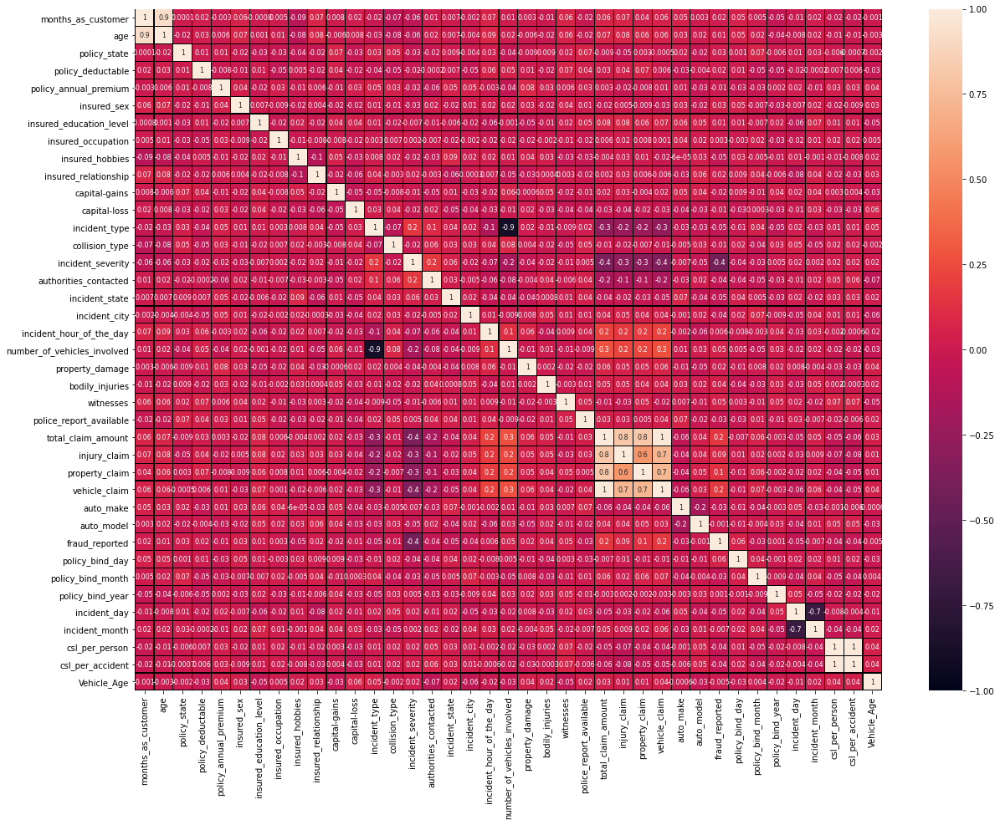

In [236]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(20,15))
sns.heatmap(new_df.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.1g',linecolor="black", annot = True, annot_kws={'size':8})
plt.yticks(rotation=0);

## Visualizing correlation between label and features

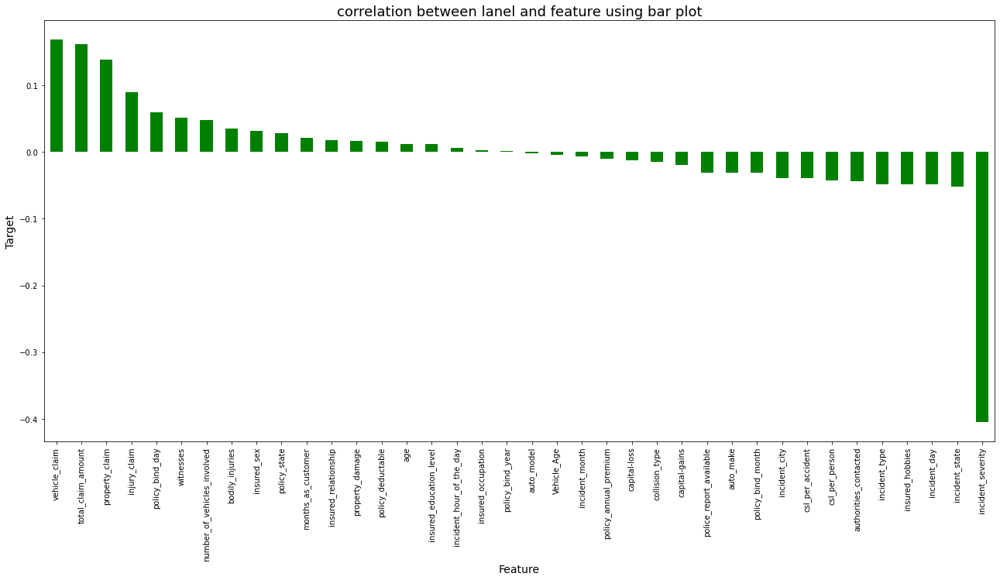

In [237]:
plt.figure(figsize=(22,10))
new_df.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar',color='g')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Target',fontsize=14)
plt.title('correlation between lanel and feature using bar plot',fontsize=18)
plt.show()

From the bar plot we can observe that the columns policy_bind_year,insured_occupation and auto_model age are very less correlated with the target. We can drop these columns if necessary.

### Separating features and label

In [238]:
x = new_df.drop("fraud_reported", axis=1)
y = new_df["fraud_reported"]

In [239]:
x.shape

(996, 38)

In [240]:
y.shape

(996,)

## Feature Scaling using StandardScalarization

In [241]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x.head()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
0,1.074671,0.987190,1.186130,-0.224722,0.621371,1.075102,0.531088,-1.162296,1.280299,-1.436113,1.010158,0.953763,0.765670,1.343731,-1.261019,1.196829,0.352556,-0.964353,-0.959495,-0.824928,1.515920,0.007356,0.466826,1.480644,0.717556,-0.188161,1.174449,0.754553,0.857248,-1.644810,0.177487,1.013751,1.686176,1.139807,-1.101370,-0.137684,0.052612,0.182338
1,0.204846,0.330455,-0.018137,1.409024,-0.251375,1.075102,0.531088,-0.166257,0.928186,-0.246617,-0.900970,0.953763,1.690043,-0.030351,-0.197535,1.196829,0.815808,0.992846,-0.527592,-0.824928,-0.659665,-1.213749,-1.335340,-0.675382,-1.777785,-1.363038,-1.376935,-1.787353,0.360986,-0.657437,1.309223,-0.166145,0.599693,0.756374,-1.101370,-0.137684,0.052612,-0.316587
2,-0.612790,-1.092470,1.186130,1.409024,0.647301,-0.930144,1.557206,1.078792,-1.360550,0.348131,0.357578,0.953763,-1.083075,-0.030351,-0.197535,1.196829,-1.037202,-0.964353,-0.671560,1.138341,-0.659665,1.228462,1.367910,-0.675382,-0.716483,0.055836,-0.737005,-0.820820,-0.631538,0.958263,-0.727901,-0.166145,-0.215170,0.852233,-0.026479,-1.066352,-1.174021,-0.316587
3,0.448397,0.221000,-1.222403,1.409024,0.658123,-0.930144,1.557206,-1.411305,-1.360550,0.942878,0.852392,-1.269246,0.765670,-1.404433,-1.261019,1.196829,-0.573950,-1.453652,-0.959495,-0.824928,-0.659665,0.007356,0.466826,-0.675382,0.392931,-0.223018,-0.217973,0.678427,-0.879669,1.317308,1.082875,-0.461119,-1.573274,-1.160788,1.553647,-0.137684,0.052612,-1.480744
4,0.204846,0.549367,-1.222403,-0.224722,1.358059,1.075102,-1.521148,1.078792,-1.360550,0.942878,1.465530,-0.684994,1.690043,-0.030351,-0.197535,-0.108088,-1.037202,-1.453652,1.200020,-0.824928,-0.659665,-1.213749,-0.434257,-0.675382,-1.730555,-1.256417,-1.404033,-1.740710,-1.624063,1.048024,-1.067422,-0.166145,1.686176,0.372942,-0.026479,1.410096,1.313327,-0.649203


## Checking for Multicolinearity

In [242]:
# Finding variance inflation factor in each scaled column i.e, x.shape[1] (1/(1-R2))

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF values,Features
0,6.851319,months_as_customer
1,6.855557,age
2,1.039410,policy_state
3,1.045656,policy_deductable
4,1.037450,policy_annual_premium
5,1.037410,insured_sex
6,1.047043,insured_education_level
7,1.017493,insured_occupation
8,1.052669,insured_hobbies
9,1.052965,insured_relationship


We can see some columns have vif values above 10 that meand they are causing multicolinerity problem. Lets drop the features having high VIF value.

In [243]:
# Dropping total_claim_amount column 
x.drop(['total_claim_amount'],axis=1,inplace=True)

In [244]:
# Again checking VIF value to confirm whether the multicollinearity still exists or not
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(x.values, i) 
                     for i in range(x.shape[1])]
vif["Features"]=x.columns
vif

,vif_Features,Features
0,6.849523,months_as_customer
1,6.855452,age
2,1.039378,policy_state
3,1.044129,policy_deductable
4,1.036722,policy_annual_premium
5,1.034404,insured_sex
6,1.046991,insured_education_level
7,1.016776,insured_occupation
8,1.050855,insured_hobbies
9,1.052941,insured_relationship


Since we have high vif value in csl_per_person and csl_per_accident. Lets remove csl_per_accident column as it has high vif value greater than csl_per_person.

In [245]:
# Dropping csl_per_accident column
x.drop("csl_per_accident",axis=1,inplace=True)

In [246]:
# Again checking VIF value to confirm whether the multicollinearity still exists or not
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(x.values, i) 
                     for i in range(x.shape[1])]
vif["Features"]=x.columns
vif

,vif_Features,Features
0,6.847077,months_as_customer
1,6.852905,age
2,1.038072,policy_state
3,1.043977,policy_deductable
4,1.036330,policy_annual_premium
5,1.029258,insured_sex
6,1.046990,insured_education_level
7,1.016674,insured_occupation
8,1.049392,insured_hobbies
9,1.048658,insured_relationship


Now the multicolineraity problem has been resolved.

In [247]:
y.value_counts()

0    750
1    246
Name: fraud_reported, dtype: int64

We can see that the data is not balanced. Lets use oversampling method to balance the data.

## Oversmapling

In [248]:
# oversampling the data
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x,y = SM.fit_resample(x,y)

In [249]:
# checking the value counts of target column again
y.value_counts()

1    750
0    750
Name: fraud_reported, dtype: int64

So the data is balanced now, lets build the classification model.

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

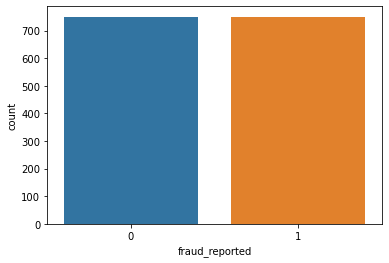

In [250]:
# Visualizing the data after oversampling
sns.countplot(y,palette="tab10")

We can visualize the balanced data too.

## Modeling

### Finding the best random state

In [251]:
from sklearn.model_selection import train_test_split as TTS
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=TTS(x,y,test_size=0.30,random_state=i)
    RFC = RandomForestClassifier()
    RFC.fit(x_train,y_train)
    pred = RFC.predict(x_test)
    acc = accuracy_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu,"at random state",maxRS)

Best accuracy is  0.92 at random state 78


So we are getting best random state and maximum accuracy. 

### Creating train test split

In [252]:
x_train,x_test,y_train,y_test=TTS(x,y,test_size=.30,random_state=maxRS)

## Classification Algorithms

In [253]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from xgboost import XGBClassifier as xgb
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score

## RandomForestClassifier

In [254]:
# Checking accuracy for RandomForestClassifier
RFC = RandomForestClassifier()
RFC.fit(x_train,y_train)
predRFC = RFC.predict(x_test)
print(accuracy_score(y_test,predRFC))
print(confusion_matrix(y_test,predRFC))
print(classification_report(y_test,predRFC))

0.9155555555555556
[[213  21]
 [ 17 199]]
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       234
           1       0.90      0.92      0.91       216

    accuracy                           0.92       450
   macro avg       0.92      0.92      0.92       450
weighted avg       0.92      0.92      0.92       450



The accuracy for RandomForestClassifier is 89.77%.

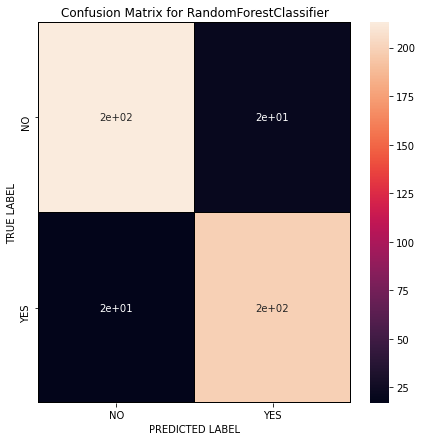

In [255]:
# Lets plot confusion matrix for RandomForestClassifier
cm = confusion_matrix(y_test,predRFC)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".1g", ax=ax,xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for RandomForestClassifier')
plt.show()

## Support Vector Machine Classifier

In [256]:
# Checking accuracy for Support Vector Machine Classifier
svc = SVC()
svc.fit(x_train,y_train)
predsvc = svc.predict(x_test)
print(accuracy_score(y_test,predsvc))
print(confusion_matrix(y_test,predsvc))
print(classification_report(y_test,predsvc))

0.8911111111111111
[[210  24]
 [ 25 191]]
              precision    recall  f1-score   support

           0       0.89      0.90      0.90       234
           1       0.89      0.88      0.89       216

    accuracy                           0.89       450
   macro avg       0.89      0.89      0.89       450
weighted avg       0.89      0.89      0.89       450



The accuracy for Support Vector Machine Classifier is 87.55%.

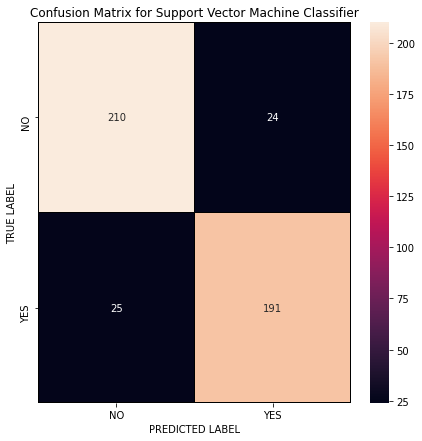

In [257]:
# Lets plot confusion matrix for Support Vector Machine Classifier
cm = confusion_matrix(y_test,predsvc)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax,xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Support Vector Machine Classifier')
plt.show()

## GradientBoostingClassifier

In [258]:
# Checking accuracy for GradientBoostingClassifier
GB = GradientBoostingClassifier()
GB.fit(x_train,y_train)
predGB = GB.predict(x_test)
print(accuracy_score(y_test,predGB))
print(confusion_matrix(y_test,predGB))
print(classification_report(y_test,predGB))

0.8866666666666667
[[209  25]
 [ 26 190]]
              precision    recall  f1-score   support

           0       0.89      0.89      0.89       234
           1       0.88      0.88      0.88       216

    accuracy                           0.89       450
   macro avg       0.89      0.89      0.89       450
weighted avg       0.89      0.89      0.89       450



The accuracy for GradientBoostingClassifier is 89.33%.

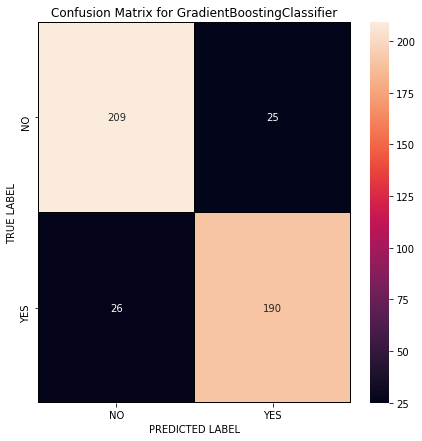

In [259]:
# Lets plot confusion matrix for GradientBoostingClassifier
cm = confusion_matrix(y_test,predGB)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax,xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for GradientBoostingClassifier')
plt.show()

# AdaBoostClassifier

In [260]:
# Checking accuracy for AdaBoostClassifier
ABC = AdaBoostClassifier()
ABC.fit(x_train,y_train)
predABC = ABC.predict(x_test)
print(accuracy_score(y_test,predABC))
print(confusion_matrix(y_test,predABC))
print(classification_report(y_test,predABC))

0.8533333333333334
[[206  28]
 [ 38 178]]
              precision    recall  f1-score   support

           0       0.84      0.88      0.86       234
           1       0.86      0.82      0.84       216

    accuracy                           0.85       450
   macro avg       0.85      0.85      0.85       450
weighted avg       0.85      0.85      0.85       450



The accuracy for AdaBoostClassifier is 85.11%.

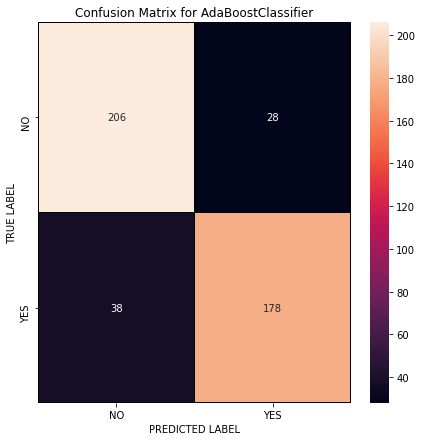

In [261]:
# Lets plot confusion matrix for AdaBoostClassifier
cm = confusion_matrix(y_test,predABC)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax,xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for AdaBoostClassifier')
plt.show()

## BaggingClassifier

In [262]:
# Checking accuracy for BaggingClassifier
BC = BaggingClassifier()
BC.fit(x_train,y_train)
predBC = BC.predict(x_test)
print(accuracy_score(y_test,predBC))
print(confusion_matrix(y_test,predBC))
print(classification_report(y_test,predBC))

0.8733333333333333
[[207  27]
 [ 30 186]]
              precision    recall  f1-score   support

           0       0.87      0.88      0.88       234
           1       0.87      0.86      0.87       216

    accuracy                           0.87       450
   macro avg       0.87      0.87      0.87       450
weighted avg       0.87      0.87      0.87       450



The accuracy for BaggingClassifier is 86.88%.

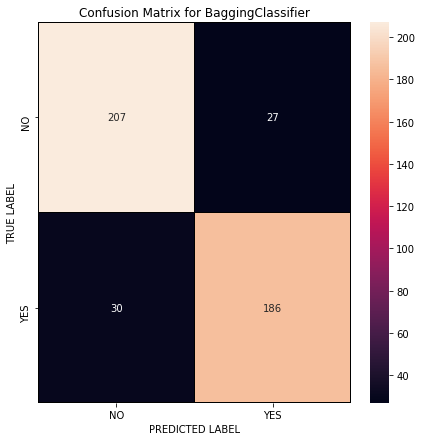

In [263]:
# Lets plot confusion matrix for BaggingClassifier
cm = confusion_matrix(y_test,predBC)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax,xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for BaggingClassifier')
plt.show()

## ExtraTreesClassifier

In [264]:
# Checking accuracy for ExtraTreesClassifier
ET = ExtraTreesClassifier()
ET.fit(x_train,y_train)
predET = ET.predict(x_test)
print(accuracy_score(y_test,predET))
print(confusion_matrix(y_test,predET))
print(classification_report(y_test,predET))

0.92
[[210  24]
 [ 12 204]]
              precision    recall  f1-score   support

           0       0.95      0.90      0.92       234
           1       0.89      0.94      0.92       216

    accuracy                           0.92       450
   macro avg       0.92      0.92      0.92       450
weighted avg       0.92      0.92      0.92       450



The accuracy for ExtraTreesClassifier is 91.77%.

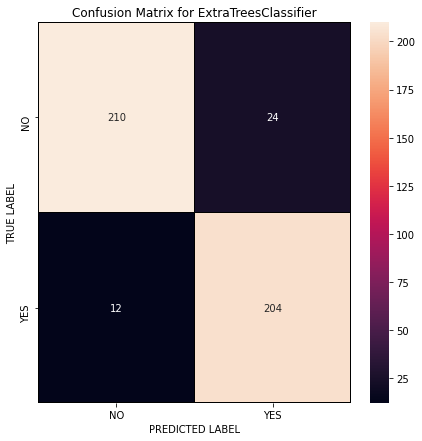

In [265]:
# Lets plot confusion matrix for ExtraTreesClassifier
cm = confusion_matrix(y_test,predET)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax,xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for ExtraTreesClassifier')
plt.show()

In [266]:
# Checking accuracy for XGBClassifier
XGB = xgb(verbosity=0)
XGB.fit(x_train,y_train)
predXGB = XGB.predict(x_test)
print(accuracy_score(y_test,predXGB))
print(confusion_matrix(y_test,predXGB))
print(classification_report(y_test,predXGB))

0.9155555555555556
[[215  19]
 [ 19 197]]
              precision    recall  f1-score   support

           0       0.92      0.92      0.92       234
           1       0.91      0.91      0.91       216

    accuracy                           0.92       450
   macro avg       0.92      0.92      0.92       450
weighted avg       0.92      0.92      0.92       450



The accuracy for XGBClassifier is 90.22%.

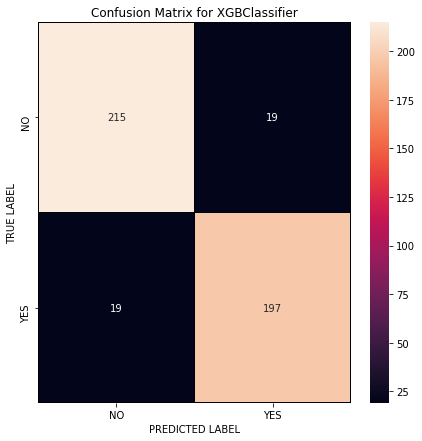

In [267]:
# Lets plot confusion matrix for XGBClassifier
cm = confusion_matrix(y_test,predXGB)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax,xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for XGBClassifier')
plt.show()

# Cross Validation Score

In [268]:
# Checking cv score for Random Forest Classifier
score=cross_val_score(RFC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ",accuracy_score(y_test,predRFC)-score.mean())

[0.74       0.83666667 0.91       0.91       0.94333333]
0.868
Difference between Accuracy score and cross validation score is -  0.04755555555555557


In [269]:
# Checking cv score for Support Vector Machine Classifier
score=cross_val_score(svc,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ",accuracy_score(y_test,predsvc)-score.mean())

[0.79       0.83666667 0.88666667 0.89333333 0.91666667]
0.8646666666666668
Difference between Accuracy score and cross validation score is -  0.02644444444444427


In [270]:
# Checking cv score for Gradient Boosting Classifier
score=cross_val_score(GB,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ",accuracy_score(y_test,predGB)-score.mean())

[0.78       0.82666667 0.91666667 0.91       0.93      ]
0.8726666666666667
Difference between Accuracy score and cross validation score is -  0.014000000000000012


In [271]:
# Checking cv score for AdaBoosting Classifier
score=cross_val_score(ABC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ",accuracy_score(y_test,predABC)-score.mean())

[0.69       0.77666667 0.91       0.92666667 0.94      ]
0.8486666666666667
Difference between Accuracy score and cross validation score is -  0.004666666666666708


In [272]:
# Checking cv score for Bagging Classifier
score=cross_val_score(BC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ",accuracy_score(y_test,predBC)-score.mean())

[0.78       0.86333333 0.88       0.87333333 0.90666667]
0.8606666666666666
Difference between Accuracy score and cross validation score is -  0.012666666666666715


In [273]:
# Checking cv score for Extra Trees Classifier
score=cross_val_score(ET,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ",accuracy_score(y_test,predET)-score.mean())

[0.82333333 0.87       0.93333333 0.95       0.94333333]
0.9040000000000001
Difference between Accuracy score and cross validation score is -  0.015999999999999903


In [274]:
# Checking cv score for XGB Classifier
score=cross_val_score(XGB,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ",accuracy_score(y_test,predXGB)-score.mean())

[0.73333333 0.86       0.92666667 0.92333333 0.94333333]
0.8773333333333333
Difference between Accuracy score and cross validation score is -  0.03822222222222227


Extra Trees Classifier model have highest accuracy i.e. 91.77% with 91.20% cross validation score which is good and the difference is too less.

## Hyperparameter Tuning

In [275]:
# Extra Trees Classifier
from sklearn.model_selection import GridSearchCV

parameters = {'criterion':['gini','entrophy'],
             'max_features':['auto','sqrt','log2'],
             'max_depth':[0,10,20],
             'n_jobs':[-2,-1,1],
             'n_estimators':[50,100,200,300]}

In [276]:
GCV = GridSearchCV(ExtraTreesClassifier(),parameters,cv=5)

In [277]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entrophy'],
                         'max_depth': [0, 10, 20],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [50, 100, 200, 300],
                         'n_jobs': [-2, -1, 1]})

In [278]:
GCV.best_params_

{'criterion': 'gini',
 'max_depth': 20,
 'max_features': 'auto',
 'n_estimators': 100,
 'n_jobs': -1}

In [279]:
Final_model = ExtraTreesClassifier(criterion='gini',max_features='log2',max_depth=20,n_estimators=300,n_jobs=-1)
Final_model.fit(x_train,y_train)
pred = Final_model.predict(x_test)
acc = accuracy_score(y_test,pred)
print(acc*100)

92.88888888888889


After tuning the model we are getting 92% accuracy.

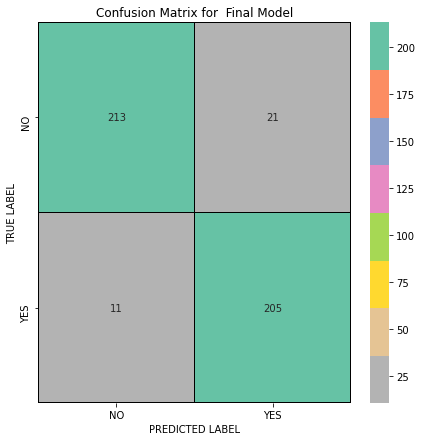

In [280]:
# Lets plot confusion matrix for  FinalModel
cm = confusion_matrix(y_test,pred)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Set2_r",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for  Final Model')
plt.show()

## Plotting ROC and compare AUC for all the models used

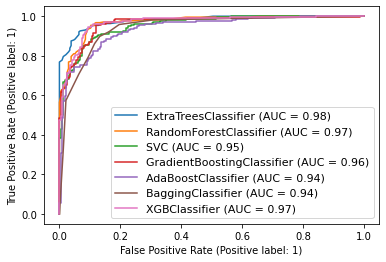

In [281]:
# Plotting for all the models used here
from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve 


disp = plot_roc_curve(ET,x_test,y_test)     # ax_=Axes with confusion matrix
plot_roc_curve(RFC, x_test, y_test, ax=disp.ax_)
plot_roc_curve(svc, x_test, y_test, ax=disp.ax_)
plot_roc_curve(GB, x_test, y_test, ax=disp.ax_)
plot_roc_curve(ABC, x_test, y_test, ax=disp.ax_)
plot_roc_curve(BC, x_test, y_test, ax=disp.ax_)
plot_roc_curve(XGB, x_test, y_test, ax=disp.ax_)

plt.legend(prop={'size':11}, loc='lower right')
plt.show()

Here we can see the Area under curve for each model used here.

## Plotting ROC and compare AUC for best model

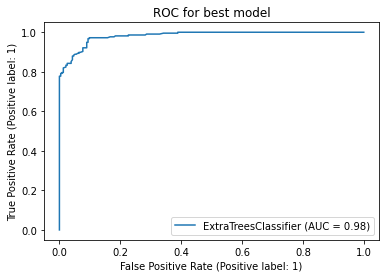

In [282]:
# Lets check the AUC for best model
plot_roc_curve(Final_model,x_test,y_test)
plt.title("ROC for best model")
plt.show()

Here we have plotted the ROC curve for the final model and the AUC value for the best model is 98%.

## Saving the model

In [283]:
# Saving the model
import joblib
joblib.dump(Final_model,"Insurance_claims_Fraud_Detection.pkl")

['Insurance_claims_Fraud_Detection.pkl']

## Predicting the saved model

In [284]:
# Lets load the saved model and get the predictions
model = joblib.load("Insurance_claims_Fraud_Detection.pkl")

# Prediction
prediction = model.predict(x_test)
prediction

array([0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0,
       0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1,
       1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1,
       0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0,
       0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0,
       1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1,
       0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1,
       0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0,
       1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0,
       1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1,
       1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0,
       1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1,

In [285]:
a = np.array(y_test)
df = pd.DataFrame()
df["Predicted"] = prediction
df["Original"] = a
df

,Predicted,Original
0,0,0
1,1,1
2,0,0
3,1,1
4,1,1
...,...,...
445,1,1
446,0,0
447,0,0
448,0,0
